In [ ]:
WA_Fn-UseC_-HR-Employee-Attrition.csv

Target feature: Attrition: Attrition is the departure of employees from the organization for any reason (voluntary or involuntary), including resignation, termination, death or retirement.


In [ ]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

In [ ]:
df= pd.read_csv('/content/ibm-hr-analytics-employee-attrition-performance (1).zip')

In [ ]:

df.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2


In [ ]:
df.shape

(1470, 35)

In [ ]:
pd.set_option('display.max_columns',None)

In [ ]:

df.head(5)

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,Over18,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,2,Female,94,3,2,Sales Executive,4,Single,5993,19479,8,Y,Yes,11,3,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,3,Male,61,2,2,Research Scientist,2,Married,5130,24907,1,Y,No,23,4,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,4,Male,92,2,1,Laboratory Technician,3,Single,2090,2396,6,Y,Yes,15,3,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,4,Female,56,3,1,Research Scientist,3,Married,2909,23159,1,Y,Yes,11,3,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,1,Male,40,3,1,Laboratory Technician,2,Married,3468,16632,9,Y,No,12,3,4,80,1,6,3,3,2,2,2,2


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int64 
 14  JobLevel                

 Conclusion:  We have total 1470 records, No null values present

9 FEATURES ARE OF cATEGORICAL type while 26 are of Integer type

In [ ]:

df.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,1470.0,36.923810,9.135373,18.0,30.00,36.0,43.00,60.0
DailyRate,1470.0,802.485714,403.509100,102.0,465.00,802.0,1157.00,1499.0
DistanceFromHome,1470.0,9.192517,8.106864,1.0,2.00,7.0,14.00,29.0
Education,1470.0,2.912925,1.024165,1.0,2.00,3.0,4.00,5.0
EmployeeCount,1470.0,1.000000,0.000000,1.0,1.00,1.0,1.00,1.0
EmployeeNumber,1470.0,1024.865306,602.024335,1.0,491.25,1020.5,1555.75,2068.0
EnvironmentSatisfaction,1470.0,2.721769,1.093082,1.0,2.00,3.0,4.00,4.0
HourlyRate,1470.0,65.891156,20.329428,30.0,48.00,66.0,83.75,100.0
JobInvolvement,1470.0,2.729932,0.711561,1.0,2.00,3.0,3.00,4.0
JobLevel,1470.0,2.063946,1.106940,1.0,1.00,2.0,3.00,5.0


In [ ]:
# few columns are skewed, lets analyse independent columns first, wgat are they, and how they effect target variable

In [ ]:
df['Age'].unique()

array([41, 49, 37, 33, 27, 32, 59, 30, 38, 36, 35, 29, 31, 34, 28, 22, 53,
       24, 21, 42, 44, 46, 39, 43, 50, 26, 48, 55, 45, 56, 23, 51, 40, 54,
       58, 20, 25, 19, 57, 52, 47, 18, 60])

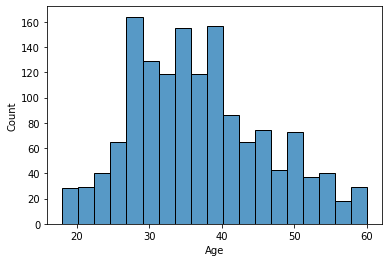

In [ ]:
sns.histplot(df['Age'])

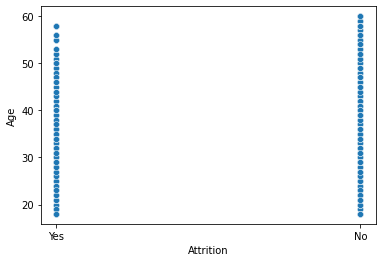

In [ ]:

sns.scatterplot(x='Attrition',y='Age', data=df)

In [ ]:
# Resignation happens ate every age

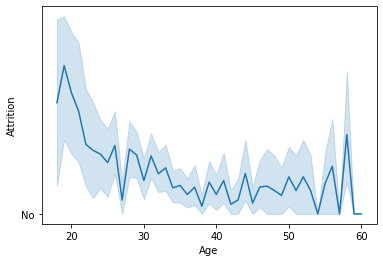

In [ ]:
sns.lineplot(x='Age',y='Attrition',data=df)

In [ ]:
#  During early age after 18, job change/job attrition is very frequient  and after 57 age is very frequesntjob attrition, may be because of health condition or because of retire

Null Values()

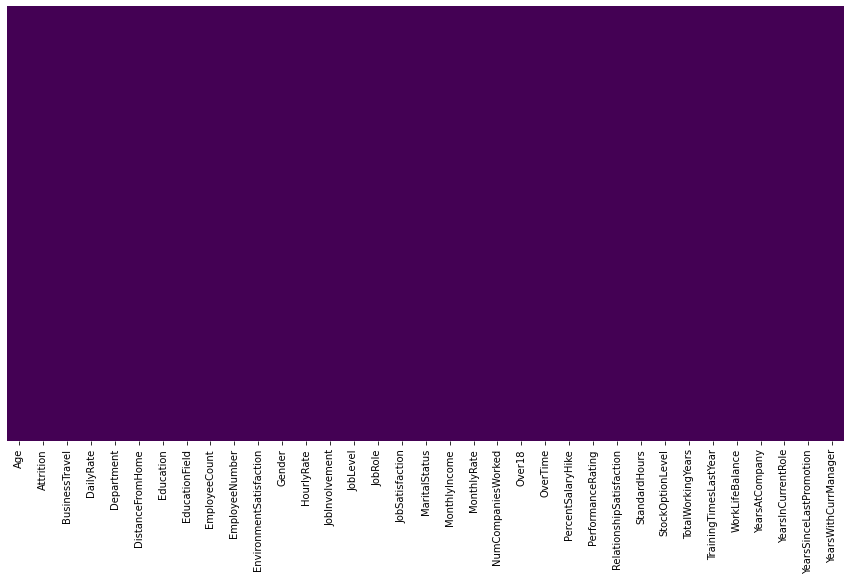

In [ ]:
plt.figure(figsize=(15,8))
sns.heatmap(df.isnull(),yticklabels=False,cbar=False,cmap='viridis')

In [ ]:
#So, we can see that there are no missing values in the dataset. 

In [ ]:
# This is binary classification problem, lets distribute target variable

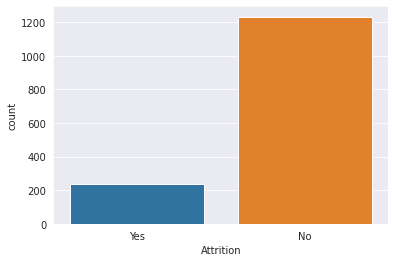

In [ ]:
sns.set_style('darkgrid')
sns.countplot(x='Attrition', data=df)

In [ ]:
df['Attrition'].value_counts()

No     1233
Yes     237
Name: Attrition, dtype: int64

([<matplotlib.patches.Wedge at 0x7efee2e49e10>,
 [Text(-1.0930587195656423, 0.606401381579494, 'No'),
  Text(0.961891673217765, -0.5336332157899548, 'Yes')],
 [Text(-0.6558352317393852, 0.3638408289476963, '83.88%'),
  Text(0.5246681853915082, -0.29107266315815716, '16.12%')])

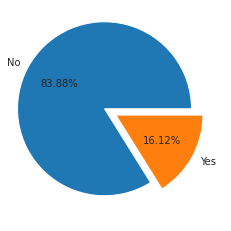

In [ ]:
plt.pie(df['Attrition'].value_counts().values,labels=df['Attrition'].value_counts().index,autopct='%1.2f%%',explode=(.15,0))

In [ ]:
# 16.12% employees have left the job

In [ ]:

df.columns

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField', 'EmployeeCount',
       'EmployeeNumber', 'EnvironmentSatisfaction', 'Gender', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction',
       'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'Over18', 'OverTime', 'PercentSalaryHike', 'PerformanceRating',
       'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')

**Business Travel vs Attririon**

In [ ]:

df['BusinessTravel'].unique()

array(['Travel_Rarely', 'Travel_Frequently', 'Non-Travel'], dtype=object)

In [ ]:
# how does traveling in job relatioed to job satisfaction

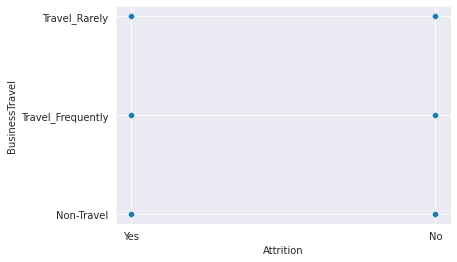

In [ ]:

sns.scatterplot('Attrition','BusinessTravel', data=df)

In [ ]:

df.groupby('BusinessTravel')['Attrition'].value_counts()

BusinessTravel     Attrition
Non-Travel         No           138
                   Yes           12
Travel_Frequently  No           208
                   Yes           69
Travel_Rarely      No           887
                   Yes          156
Name: Attrition, dtype: int64

In [ ]:
# Rarely Travel person doing attrition more

In [ ]:
df['BusinessTravel'].value_counts()


Travel_Rarely        1043
Travel_Frequently     277
Non-Travel            150
Name: BusinessTravel, dtype: int64

([<matplotlib.patches.Wedge at 0x7efee2d72650>,
 [Text(-0.6728966948858769, 0.8701781645224518, 'Travel_Rarely'),
  Text(0.36441614894376395, -1.037882878936249, 'Travel_Frequently'),
  Text(1.0439613016770868, -0.3466191001671471, 'Non-Travel')],
 [Text(-0.36703456084684194, 0.4746426351940646, '70.95%'),
  Text(0.19877244487841667, -0.5661179339652267, '18.84%'),
  Text(0.5694334372784109, -0.18906496372753476, '10.20%')])

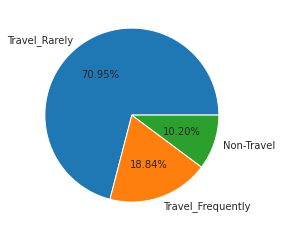

In [ ]:
# In the dataset
plt.pie(df['BusinessTravel'].value_counts().values,labels=df['BusinessTravel'].value_counts().index,autopct='%1.2f%%')

In [ ]:
# Rarely travel job are high in number, semms person are comnfortable after doing job from office after that they 
# didnt want to go to the fiels/ travel so they changes the JOB

DailyRate vd attrition

In [ ]:
# Daily Rate is salary level, ofcouse it will effect Attrition but how?

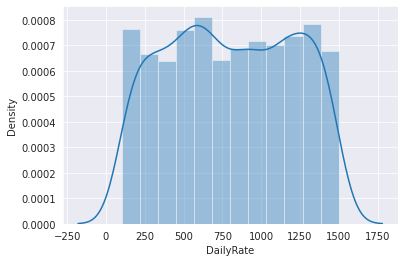

In [ ]:

sns.distplot(df['DailyRate'])

In [ ]:
# Not normally distributed

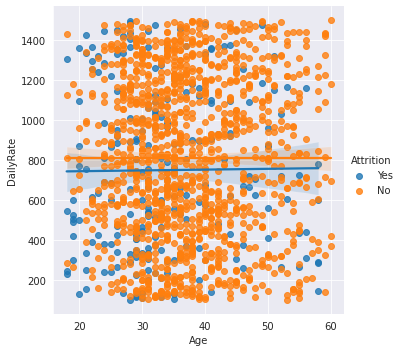

In [ ]:
sns.lmplot(x = 'Age', y = 'DailyRate', hue = 'Attrition', data = df)

In [ ]:

# Attrition is  happening at lower dailyRate .

Gender effect

In [ ]:
df['Gender'].value_counts()

Male      882
Female    588
Name: Gender, dtype: int64

In [ ]:
# which gender is leaving job more

df.groupby('Gender')['Attrition'].value_counts()

Gender  Attrition
Female  No           501
        Yes           87
Male    No           732
        Yes          150
Name: Attrition, dtype: int64

In [ ]:

# as expected, More Male are leaving jobs more than Female

In [ ]:
df.columns

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField', 'EmployeeCount',
       'EmployeeNumber', 'EnvironmentSatisfaction', 'Gender', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction',
       'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'Over18', 'OverTime', 'PercentSalaryHike', 'PerformanceRating',
       'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')

In [ ]:
df.groupby('Gender')['DailyRate'].mean()

Gender
Female    808.273810
Male      798.626984
Name: DailyRate, dtype: float64

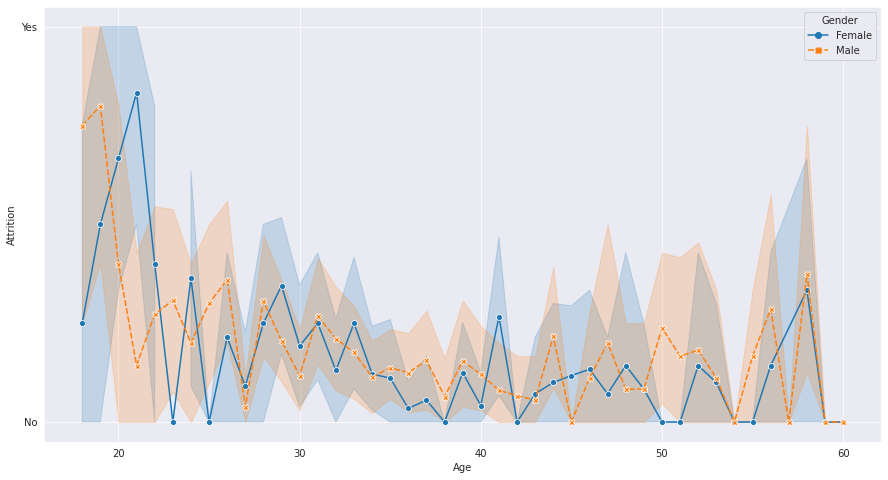

In [ ]:
plt.figure(figsize=(15,8))
sns.lineplot(x='Age',y='Attrition',hue='Gender',style='Gender',markers=True,data=df)

In [ ]:
# Male are doing mpore Attrition

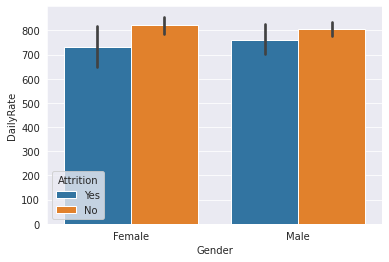

In [ ]:
sns.barplot(y='DailyRate',x='Gender',hue='Attrition', data=df)

In [ ]:

# DailyRate is approximately equal for Gender, But still Male are doing more Attrition

In [ ]:

df.columns

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField', 'EmployeeCount',
       'EmployeeNumber', 'EnvironmentSatisfaction', 'Gender', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction',
       'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'Over18', 'OverTime', 'PercentSalaryHike', 'PerformanceRating',
       'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')

Department vs Attrition

In [ ]:
# Which department is less satisfied with job or have more attrition

In [ ]:

df['Department'].unique()

array(['Sales', 'Research & Development', 'Human Resources'], dtype=object)

In [ ]:
df.groupby('Department')['Attrition'].value_counts()

Department              Attrition
Human Resources         No            51
                        Yes           12
Research & Development  No           828
                        Yes          133
Sales                   No           354
                        Yes           92
Name: Attrition, dtype: int64

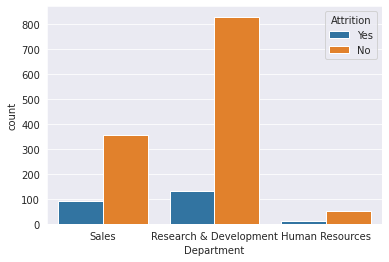

In [ ]:
sns.countplot('Department',hue='Attrition',data=df)

In [ ]:

# As per count, department have not much effect on attrition

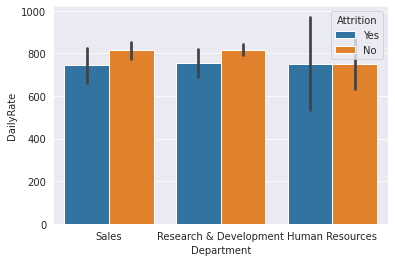

In [ ]:
sns.barplot(x='Department',y='DailyRate',hue='Attrition', data=df)

In [ ]:

df['Department'].value_counts()

Research & Development    961
Sales                     446
Human Resources            63
Name: Department, dtype: int64

([<matplotlib.patches.Wedge at 0x7efee11e1790>,
 [Text(-0.5108751650946098, 0.9741696801325502, 'Research & Development'),
  Text(0.37548555701288383, -1.0339296864268501, 'Sales'),
  Text(1.0900447132085396, -0.1476567750091844, 'Human Resources')],
 [Text(-0.27865918096069625, 0.5313652800723001, '65.37%'),
  Text(0.20481030382520934, -0.5639616471419181, '30.34%'),
  Text(0.5945698435682942, -0.08054005909591874, '4.29%')])

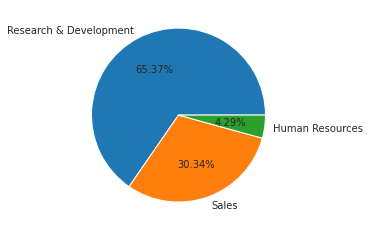

In [ ]:
plt.pie(df['Department'].value_counts().values,labels=df['Department'].value_counts().index,autopct='%1.2f%%')

DistanceFromHome vs Attrition

In [ ]:
df['DistanceFromHome'].unique()

array([ 1,  8,  2,  3, 24, 23, 27, 16, 15, 26, 19, 21,  5, 11,  9,  7,  6,
       10,  4, 25, 12, 18, 29, 22, 14, 20, 28, 17, 13])

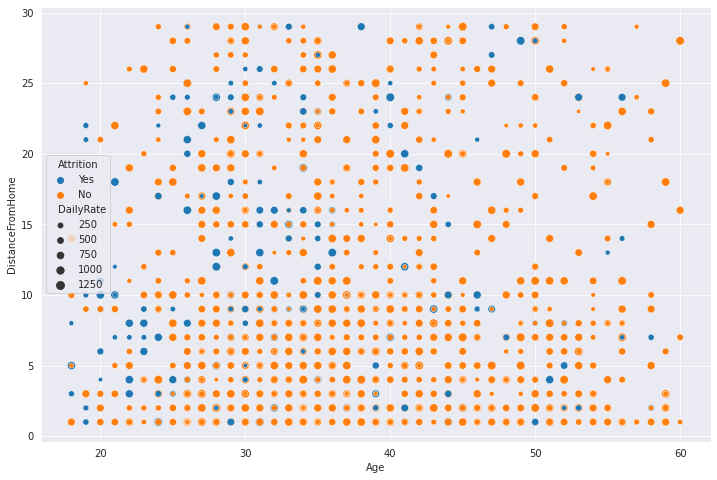

In [ ]:
plt.figure(figsize=(12,8))
sns.scatterplot(x='Age',y='DistanceFromHome',hue='Attrition', size='DailyRate', data=df)

In [ ]:
# From the graph, employees at early age and living far away from office are doing attrition

# As the Age increases, Attrition decreases

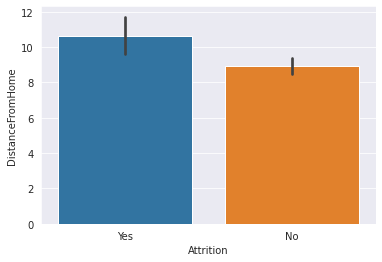

In [ ]:
sns.barplot(x='Attrition',y='DistanceFromHome', data=df)

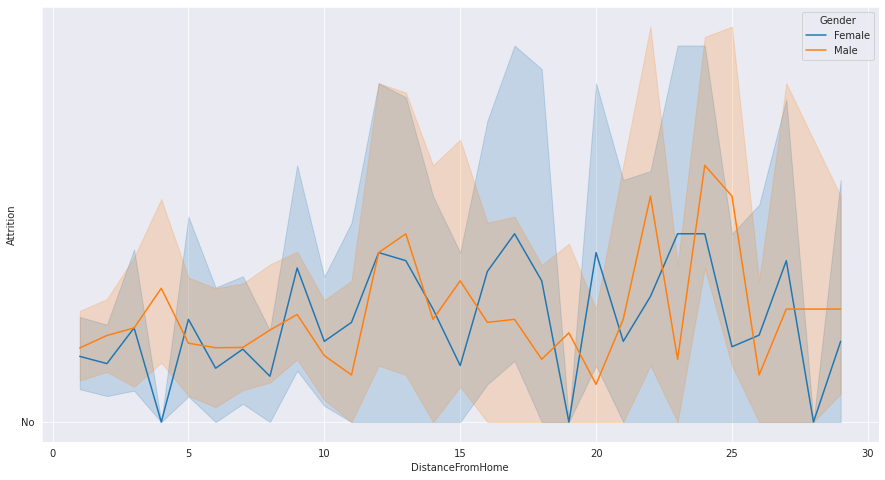

In [ ]:
plt.figure(figsize=(15,8))
sns.lineplot(x='DistanceFromHome',y='Attrition',hue='Gender',markers=True,data=df)

In [ ]:
df.columns

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField', 'EmployeeCount',
       'EmployeeNumber', 'EnvironmentSatisfaction', 'Gender', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction',
       'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'Over18', 'OverTime', 'PercentSalaryHike', 'PerformanceRating',
       'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')

In [ ]:

df['Education'].unique()

array([2, 1, 4, 3, 5])

# Ordinal Categorical feature

In [ ]:
df.groupby('Education')['Attrition'].value_counts()

Education  Attrition
1          No           139
           Yes           31
2          No           238
           Yes           44
3          No           473
           Yes           99
4          No           340
           Yes           58
5          No            43
           Yes            5
Name: Attrition, dtype: int64

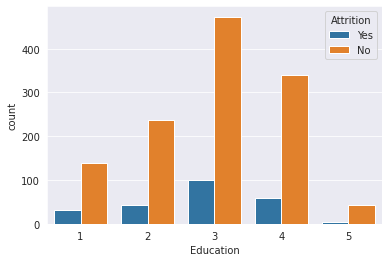

In [ ]:
sns.countplot(x='Education',hue='Attrition', data=df)

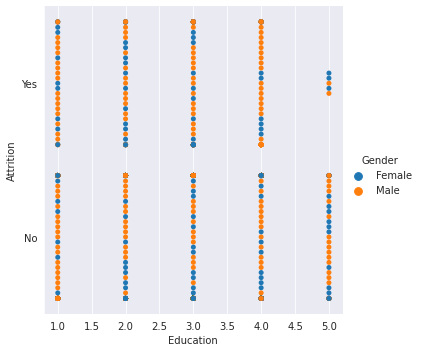

In [ ]:
sns.catplot(x="Education", y="Attrition", hue="Gender", kind="swarm", data=df)

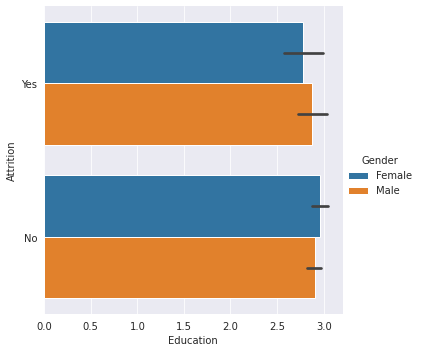

In [ ]:

sns.catplot(x="Education", y="Attrition", hue="Gender", kind="bar", data=df)

In [ ]:
df.columns

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField', 'EmployeeCount',
       'EmployeeNumber', 'EnvironmentSatisfaction', 'Gender', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction',
       'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'Over18', 'OverTime', 'PercentSalaryHike', 'PerformanceRating',
       'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')

EducationField

In [ ]:
df['EducationField'].unique()

array(['Life Sciences', 'Other', 'Medical', 'Marketing',
       'Technical Degree', 'Human Resources'], dtype=object)

In [ ]:
df.groupby('Education')['EducationField'].value_counts()

Education  EducationField  
1          Life Sciences        67
           Medical              63
           Technical Degree     19
           Marketing            14
           Other                 5
           Human Resources       2
2          Life Sciences       116
           Medical              99
           Marketing            24
           Technical Degree     22
           Other                19
           Human Resources       2
3          Life Sciences       233
           Medical             183
           Marketing            59
           Technical Degree     57
           Other                24
           Human Resources      16
4          Life Sciences       173
           Medical             104
           Marketing            52
           Other                33
           Technical Degree     31
           Human Resources       5
5          Life Sciences        17
           Medical              15
           Marketing            10
           Technical Degree

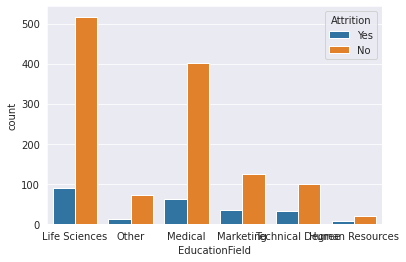

In [ ]:
sns.countplot(df['EducationField'],hue='Attrition',data=df)

In [ ]:
# If jobs count are more, then accordingly attrition is also more

In [ ]:
df.columns

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField', 'EmployeeCount',
       'EmployeeNumber', 'EnvironmentSatisfaction', 'Gender', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction',
       'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'Over18', 'OverTime', 'PercentSalaryHike', 'PerformanceRating',
       'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')

EmployeeCount

In [ ]:
df['EmployeeCount'].unique()

array([1])

In [ ]:
df['EmployeeCount'].value_counts()

1    1470
Name: EmployeeCount, dtype: int64

In [ ]:
# This feature will not contribute to find attrition as it have same information in all rexcords, we can drop this

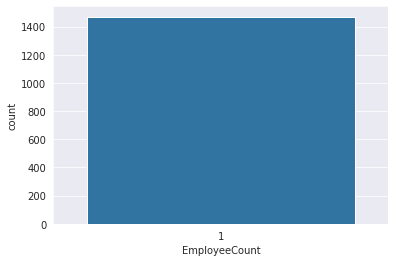

In [ ]:

sns.countplot(df['EmployeeCount'])

EmployeeNumber

In [ ]:
df['EmployeeNumber'].value_counts()

1       1
1391    1
1389    1
1387    1
1383    1
       ..
659     1
657     1
656     1
655     1
2068    1
Name: EmployeeNumber, Length: 1470, dtype: int64

In [ ]:
# This is Employee ID , which is unique for every feature, This will not contributue to pridict Attrition, we can drop this as well


EnvironmentSatisfaction

In [ ]:

df['EnvironmentSatisfaction'].unique()

array([2, 3, 4, 1])

In [ ]:

# This is ordinal categorical feature

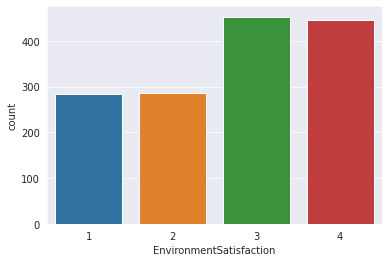

In [ ]:
sns.countplot(df['EnvironmentSatisfaction'],data=df)

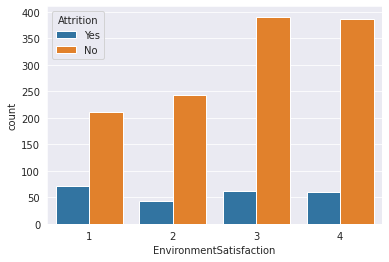

In [ ]:

sns.countplot(df['EnvironmentSatisfaction'], hue='Attrition',data=df)

In [ ]:

#  Less EnvironmentalSatifaction.,,  more Attrition


HourlyRate

In [ ]:

df['HourlyRate'].unique()

array([ 94,  61,  92,  56,  40,  79,  81,  67,  44,  84,  49,  31,  93,
        50,  51,  80,  96,  78,  45,  82,  53,  83,  58,  72,  48,  42,
        41,  86,  97,  75,  33,  37,  73,  98,  36,  47,  71,  30,  43,
        99,  59,  95,  57,  76,  87,  66,  55,  32,  52,  70,  62,  64,
        63,  60, 100,  46,  39,  77,  35,  91,  54,  34,  90,  65,  88,
        85,  89,  68,  69,  74,  38])

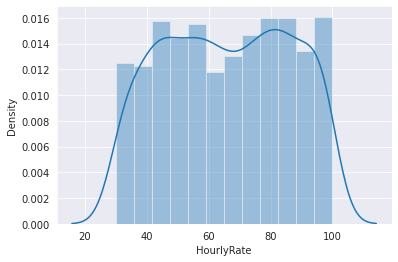

In [ ]:
sns.distplot(df['HourlyRate'])

In [ ]:
# Not normally distributed

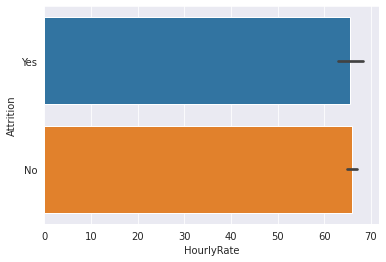

In [ ]:
sns.barplot(df['HourlyRate'],df['Attrition'], data=df)

In [ ]:
df.columns

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField', 'EmployeeCount',
       'EmployeeNumber', 'EnvironmentSatisfaction', 'Gender', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction',
       'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'Over18', 'OverTime', 'PercentSalaryHike', 'PerformanceRating',
       'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')

JobInvolvement

In [ ]:
df['JobInvolvement'].unique()

array([3, 2, 4, 1])

In [ ]:
# More level means more involvement

In [ ]:
df.groupby('JobInvolvement')['JobInvolvement'].value_counts()

JobInvolvement  JobInvolvement
1               1                  83
2               2                 375
3               3                 868
4               4                 144
Name: JobInvolvement, dtype: int64

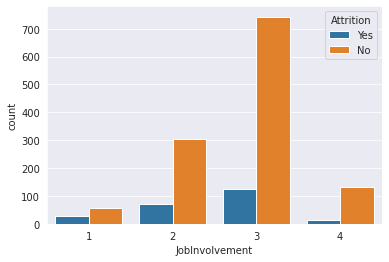

In [ ]:

sns.countplot(df['JobInvolvement'],hue='Attrition',data=df)

In [ ]:

#  More involvement, less change for attrition

JobLevel

In [ ]:

df['JobLevel'].unique()

array([2, 1, 3, 4, 5])

In [ ]:


# ordinal categorical column

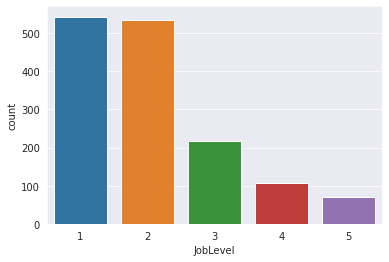

In [ ]:
sns.countplot(df['JobLevel'])

In [ ]:
# Low level workiners are more.

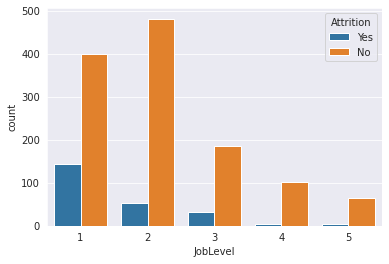

In [ ]:
sns.countplot(df['JobLevel'], hue='Attrition', data=df)

In [ ]:

# low job level workers changes job very frequently


JobRole

In [ ]:
df['JobRole'].unique()

array(['Sales Executive', 'Research Scientist', 'Laboratory Technician',
       'Manufacturing Director', 'Healthcare Representative', 'Manager',
       'Sales Representative', 'Research Director', 'Human Resources'],
      dtype=object)

In [ ]:

df['JobRole'].value_counts()

Sales Executive              326
Research Scientist           292
Laboratory Technician        259
Manufacturing Director       145
Healthcare Representative    131
Manager                      102
Sales Representative          83
Research Director             80
Human Resources               52
Name: JobRole, dtype: int64

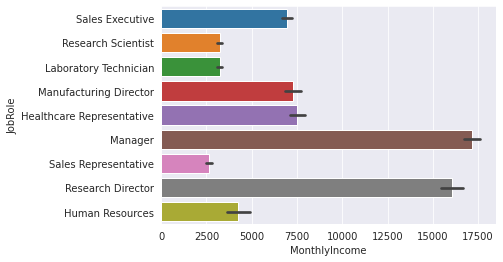

In [ ]:
sns.barplot('MonthlyIncome','JobRole',data=df)

In [ ]:
# Managers and Research Directors are taking more salary

In [ ]:
df.columns

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField', 'EmployeeCount',
       'EmployeeNumber', 'EnvironmentSatisfaction', 'Gender', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction',
       'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'Over18', 'OverTime', 'PercentSalaryHike', 'PerformanceRating',
       'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')


JobSatisfaction

In [ ]:
df['JobSatisfaction'].unique()

array([4, 2, 3, 1])

In [ ]:
# More peroples are satisfied

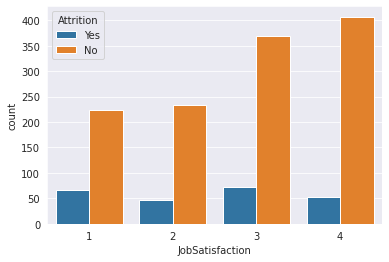

In [ ]:
sns.countplot(df['JobSatisfaction'],hue='Attrition', data=df)


MaritalStatus

In [ ]:
df['MaritalStatus'].value_counts()

Married     673
Single      470
Divorced    327
Name: MaritalStatus, dtype: int64

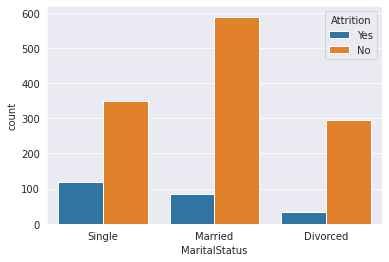

In [ ]:

sns.countplot(df['MaritalStatus'], hue='Attrition',data=df)

In [ ]:
# SIngle person do more attrition, divorce do less


MonthlyIncome

In [ ]:
df['MonthlyIncome'].unique()

array([5993, 5130, 2090, ..., 9991, 5390, 4404])

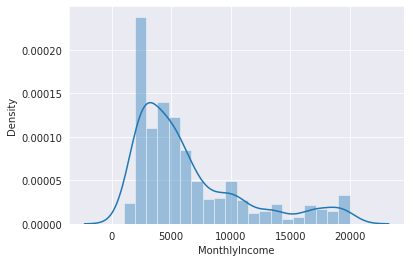

In [ ]:
sns.distplot(df['MonthlyIncome'])

In [ ]:
# right skewed data

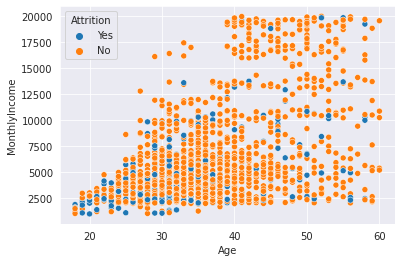

In [ ]:
sns.scatterplot(x='Age', y='MonthlyIncome',hue='Attrition', data=df)

In [ ]:
# Less Age and Less Salary do more Attrition

MonthlyRate

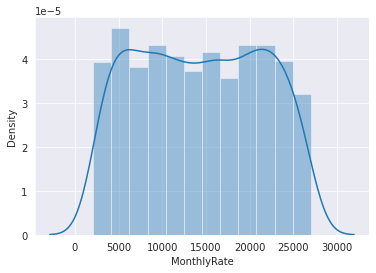

In [ ]:
sns.distplot(df['MonthlyRate'])

In [ ]:
# Non uniform data

NumCompaniesWorked

In [ ]:
df['NumCompaniesWorked'].unique()

array([8, 1, 6, 9, 0, 4, 5, 2, 7, 3])

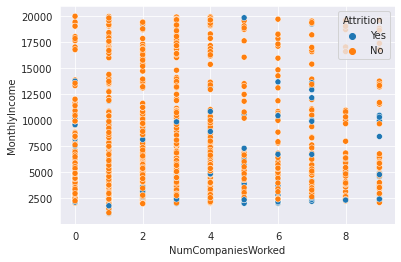

In [ ]:
sns.scatterplot(x='NumCompaniesWorked',y='MonthlyIncome',hue='Attrition', data=df)

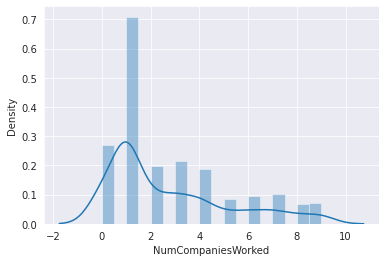

In [ ]:
sns.distplot(df['NumCompaniesWorked'])

In [ ]:
# Right Skewed data

Over18

In [ ]:
df['Over18'].unique()

array(['Y'], dtype=object)

In [ ]:
# it has same info, not relevent for prediction, we can drop this


OverTime

In [ ]:

df['OverTime'].unique()

array(['Yes', 'No'], dtype=object)


PercentSalaryHike

In [ ]:
df['PercentSalaryHike'].unique()

array([11, 23, 15, 12, 13, 20, 22, 21, 17, 14, 16, 18, 19, 24, 25])

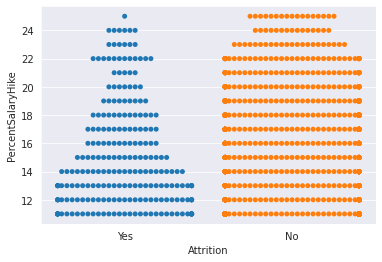

In [ ]:
sns.swarmplot(data = df, x='Attrition', y='PercentSalaryHike')

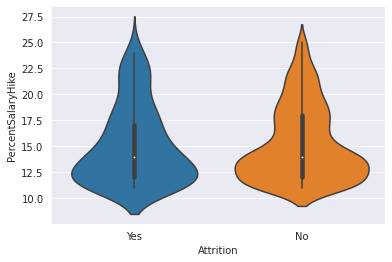

In [ ]:
sns.violinplot(data = df, x='Attrition', y='PercentSalaryHike')

In [ ]:
# As the percentage salary hike increases, job sttrition decreases

PerformanceRating

In [ ]:
df['PerformanceRating'].unique()

array([3, 4])

In [ ]:
df['PerformanceRating'].value_counts()

3    1244
4     226
Name: PerformanceRating, dtype: int64

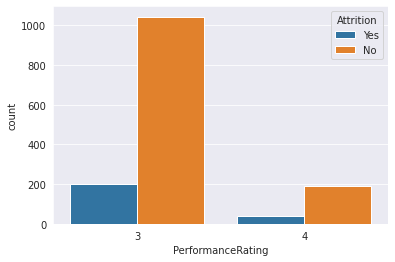

In [ ]:
sns.countplot(df['PerformanceRating'],hue='Attrition', data=df)

In [ ]:
# Low performace Rating peoples quits more to change job

RelationshipSatisfaction

In [ ]:

df['RelationshipSatisfaction'].unique()

array([1, 4, 2, 3])

In [ ]:
df.groupby('RelationshipSatisfaction')['Attrition'].value_counts()

RelationshipSatisfaction  Attrition
1                         No           219
                          Yes           57
2                         No           258
                          Yes           45
3                         No           388
                          Yes           71
4                         No           368
                          Yes           64
Name: Attrition, dtype: int64

In [ ]:
df.columns

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField', 'EmployeeCount',
       'EmployeeNumber', 'EnvironmentSatisfaction', 'Gender', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction',
       'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'Over18', 'OverTime', 'PercentSalaryHike', 'PerformanceRating',
       'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')

StandardHours

In [ ]:
df['StandardHours'].unique()

array([80])

In [ ]:
df['StandardHours'].nunique()

1

In [ ]:
# This has 1 type of info only, we can drop this

StockOptionLevel

In [ ]:
df['StockOptionLevel'].unique()

array([0, 1, 3, 2])

TotalWorkingYears

In [ ]:
df['TotalWorkingYears'].unique()

array([ 8, 10,  7,  6, 12,  1, 17,  5,  3, 31, 13,  0, 26, 24, 22,  9, 19,
        2, 23, 14, 15,  4, 29, 28, 21, 25, 20, 11, 16, 37, 38, 30, 40, 18,
       36, 34, 32, 33, 35, 27])

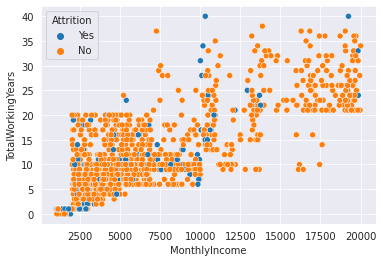

In [ ]:
sns.scatterplot(x='MonthlyIncome',y='TotalWorkingYears', hue='Attrition', data=df)

In [ ]:
# MOnthly income increases when totalworking years increases

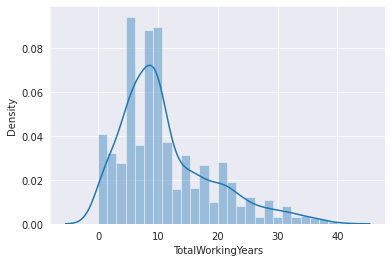

In [ ]:

sns.distplot(df['TotalWorkingYears'])

TrainingTimesLastYear

In [ ]:
df['TrainingTimesLastYear'].unique()

array([0, 3, 2, 5, 1, 4, 6])

WorkLifeBalance

In [ ]:
df['WorkLifeBalance'].unique()

array([1, 3, 2, 4])

In [ ]:
df.groupby('WorkLifeBalance')['Attrition'].value_counts()

WorkLifeBalance  Attrition
1                No            55
                 Yes           25
2                No           286
                 Yes           58
3                No           766
                 Yes          127
4                No           126
                 Yes           27
Name: Attrition, dtype: int64

YearsAtCompany

In [ ]:

df['YearsAtCompany'].unique()

array([ 6, 10,  0,  8,  2,  7,  1,  9,  5,  4, 25,  3, 12, 14, 22, 15, 27,
       21, 17, 11, 13, 37, 16, 20, 40, 24, 33, 19, 36, 18, 29, 31, 32, 34,
       26, 30, 23])

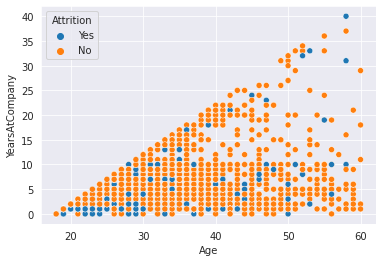

In [ ]:

sns.scatterplot(x='Age',y='YearsAtCompany',hue='Attrition',data=df)

In [ ]:
# As age increases, Yeasratcompany increases

In [ ]:

df.columns

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField', 'EmployeeCount',
       'EmployeeNumber', 'EnvironmentSatisfaction', 'Gender', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction',
       'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'Over18', 'OverTime', 'PercentSalaryHike', 'PerformanceRating',
       'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')

In [ ]:
df['Attrition'].nunique()

2

In [ ]:

df['Attrition'].unique()

array(['Yes', 'No'], dtype=object)

In [ ]:
df['Attrition'].value_counts()

No     1233
Yes     237
Name: Attrition, dtype: int64

In [ ]:
df['Attrition']=np.where(df['Attrition']=='Yes',1,0)

In [ ]:
df.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,Over18,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,1,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,2,Female,94,3,2,Sales Executive,4,Single,5993,19479,8,Y,Yes,11,3,1,80,0,8,0,1,6,4,0,5
1,49,0,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,3,Male,61,2,2,Research Scientist,2,Married,5130,24907,1,Y,No,23,4,4,80,1,10,3,3,10,7,1,7
2,37,1,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,4,Male,92,2,1,Laboratory Technician,3,Single,2090,2396,6,Y,Yes,15,3,2,80,0,7,3,3,0,0,0,0
3,33,0,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,4,Female,56,3,1,Research Scientist,3,Married,2909,23159,1,Y,Yes,11,3,3,80,0,8,3,3,8,7,3,0
4,27,0,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,1,Male,40,3,1,Laboratory Technician,2,Married,3468,16632,9,Y,No,12,3,4,80,1,6,3,3,2,2,2,2


In [ ]:
df.shape

(1470, 35)

In [ ]:
a=df.drop('Attrition', axis=1)
b=df['Attrition']

In [ ]:
a.shape , b.shape

((1470, 34), (1470,))

In [ ]:
df=pd.concat([a,b], axis=1)

In [ ]:
df.shape

(1470, 35)

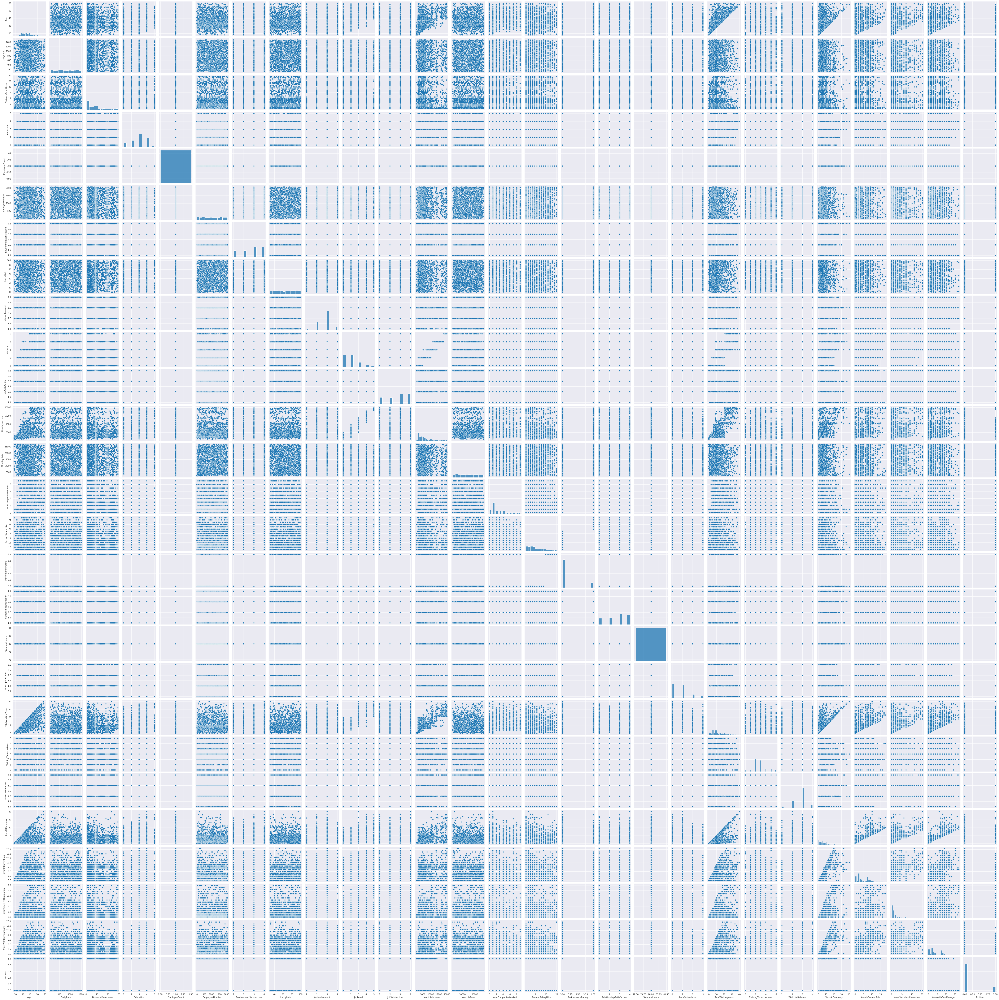

In [ ]:
sns.pairplot(df)

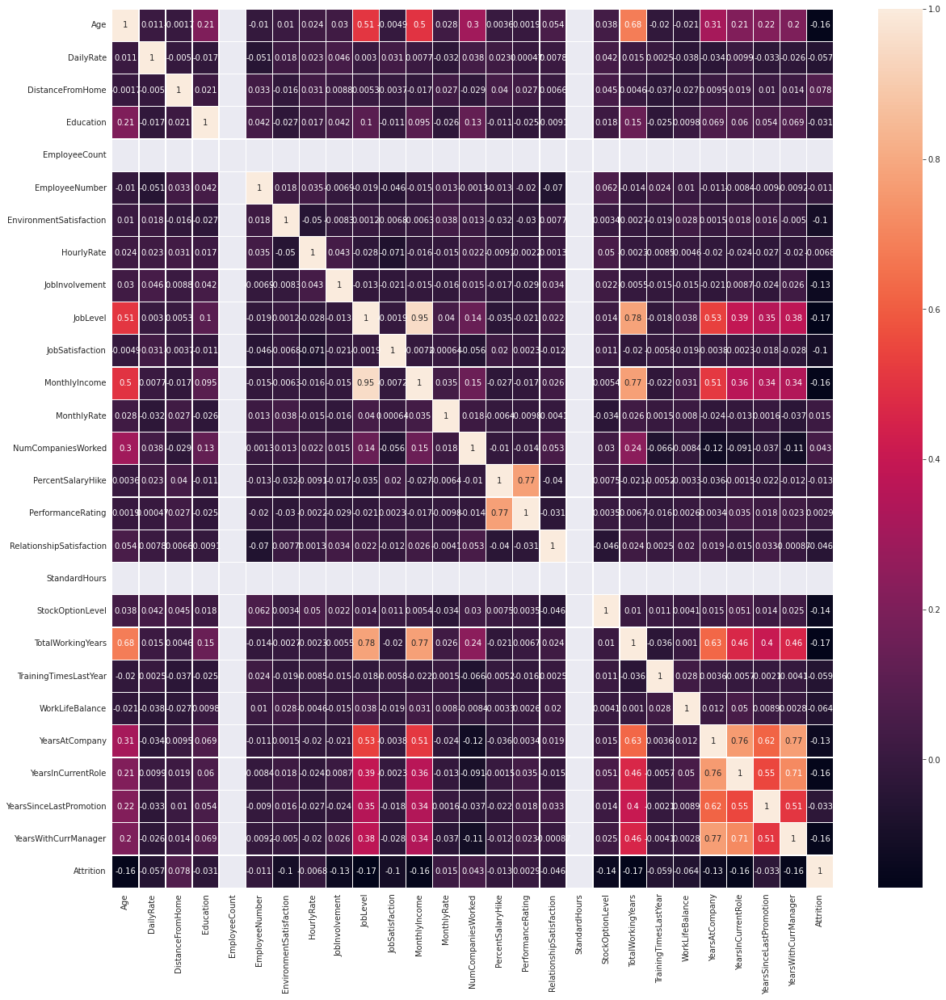

In [ ]:

plt.figure(figsize=(20,20))
sns.heatmap(df.corr(),annot=True, linecolor='white',linewidths=.25)

In [ ]:
# Most of the features are low correlated with target variable and soime strongly correlated

In [ ]:
# Monthly income and Job Level are highly correlated
# Totalworkingyears are highly correlated with Joblevel
#Totalworkingyears are highly corre;ated with MOnthly income

In [ ]:

# Yearsatcompany  and Years in current role are highly correlated

VIF

In [ ]:
num=df.select_dtypes(np.number)

In [ ]:
num.drop('Attrition',axis=1, inplace=True)

In [ ]:
num.columns

Index(['Age', 'DailyRate', 'DistanceFromHome', 'Education', 'EmployeeCount',
       'EmployeeNumber', 'EnvironmentSatisfaction', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobSatisfaction', 'MonthlyIncome',
       'MonthlyRate', 'NumCompaniesWorked', 'PercentSalaryHike',
       'PerformanceRating', 'RelationshipSatisfaction', 'StandardHours',
       'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear',
       'WorkLifeBalance', 'YearsAtCompany', 'YearsInCurrentRole',
       'YearsSinceLastPromotion', 'YearsWithCurrManager'],
      dtype='object')

In [ ]:
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
standard=sc.fit_transform(num)

In [ ]:
standard=pd.DataFrame(standard, columns=num.columns)

In [ ]:

from statsmodels.stats.outliers_influence import variance_inflation_factor

In [ ]:
VIF= pd.DataFrame()
VIF['features']= standard.columns
VIF['vif']=[variance_inflation_factor(standard.values,i) for i in range(len(standard.columns))]

In [ ]:
VIF

,features,vif
0,Age,2.044997
1,DailyRate,1.020863
2,DistanceFromHome,1.016514
3,Education,1.061247
4,EmployeeCount,NaN
5,EmployeeNumber,1.019558
6,EnvironmentSatisfaction,1.010565
7,HourlyRate,1.019212
8,JobInvolvement,1.016367
9,JobLevel,11.208731


In [ ]:
# Joblevel is already highly correlated with  Monthly income and total workingyears
# Few columns are not rellevent with sttrition., so drop them

In [ ]:
num.shape

(1470, 26)

In [ ]:

standard.drop(['EmployeeCount','EmployeeNumber','StandardHours','JobLevel'], axis=1, inplace=True)

In [ ]:

standard.shape

(1470, 22)

In [ ]:

VIF= pd.DataFrame()
VIF['features']= standard.columns
VIF['vif']=[variance_inflation_factor(standard.values,i) for i in range(len(standard.columns))]

In [ ]:
VIF

,features,vif
0,Age,2.043149
1,DailyRate,1.018044
2,DistanceFromHome,1.011218
3,Education,1.059315
4,EnvironmentSatisfaction,1.009724
5,HourlyRate,1.016236
6,JobInvolvement,1.016309
7,JobSatisfaction,1.014112
8,MonthlyIncome,2.538887
9,MonthlyRate,1.011715


In [ ]:
# Multicolinearity is in controll now.

In [ ]:
# Remove features from the dataset

df.drop(['EmployeeCount','EmployeeNumber','StandardHours','JobLevel','Over18'], axis=1, inplace=True)

In [ ]:
df.shape

(1470, 30)

In [ ]:
# 5 features have been removed

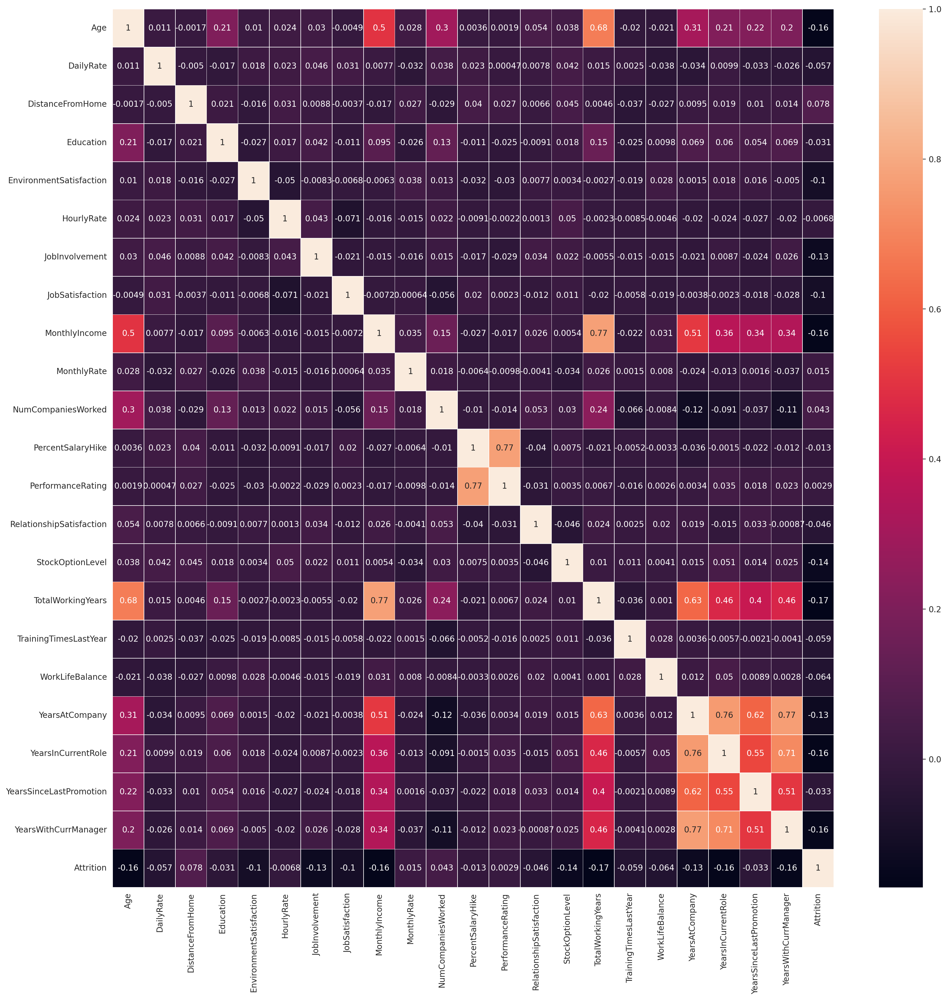

In [ ]:
# Again correlation
plt.figure(figsize=(20,20),dpi=200)
sns.heatmap(df.corr(),annot=True, linecolor='white',linewidths=.25)

In [ ]:
df.skew()

Age                         0.413286
DailyRate                  -0.003519
DistanceFromHome            0.958118
Education                  -0.289681
EnvironmentSatisfaction    -0.321654
HourlyRate                 -0.032311
JobInvolvement             -0.498419
JobSatisfaction            -0.329672
MonthlyIncome               1.369817
MonthlyRate                 0.018578
NumCompaniesWorked          1.026471
PercentSalaryHike           0.821128
PerformanceRating           1.921883
RelationshipSatisfaction   -0.302828
StockOptionLevel            0.968980
TotalWorkingYears           1.117172
TrainingTimesLastYear       0.553124
WorkLifeBalance            -0.552480
YearsAtCompany              1.764529
YearsInCurrentRole          0.917363
YearsSinceLastPromotion     1.984290
YearsWithCurrManager        0.833451
Attrition                   1.844366
dtype: float64

Outliers

In [ ]:

num= df.select_dtypes(np.number)

Age                            AxesSubplot(0.125,0.749828;0.133621x0.130172)
DailyRate                   AxesSubplot(0.285345,0.749828;0.133621x0.130172)
DistanceFromHome             AxesSubplot(0.44569,0.749828;0.133621x0.130172)
Education                   AxesSubplot(0.606034,0.749828;0.133621x0.130172)
EnvironmentSatisfaction     AxesSubplot(0.766379,0.749828;0.133621x0.130172)
HourlyRate                     AxesSubplot(0.125,0.593621;0.133621x0.130172)
JobInvolvement              AxesSubplot(0.285345,0.593621;0.133621x0.130172)
JobSatisfaction              AxesSubplot(0.44569,0.593621;0.133621x0.130172)
MonthlyIncome               AxesSubplot(0.606034,0.593621;0.133621x0.130172)
MonthlyRate                 AxesSubplot(0.766379,0.593621;0.133621x0.130172)
NumCompaniesWorked             AxesSubplot(0.125,0.437414;0.133621x0.130172)
PercentSalaryHike           AxesSubplot(0.285345,0.437414;0.133621x0.130172)
PerformanceRating            AxesSubplot(0.44569,0.437414;0.133621x0.130172)

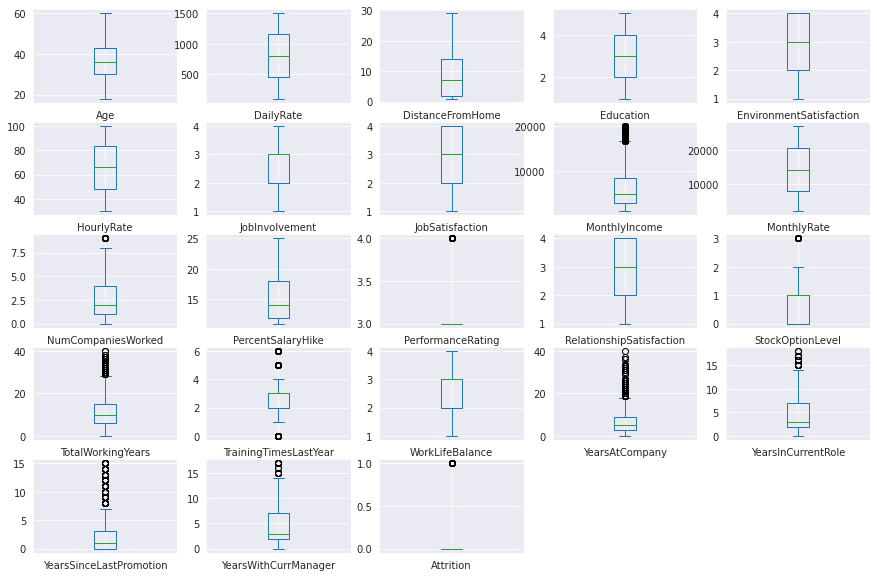

In [ ]:

df.plot(kind='box', subplots=True, layout=(5,5),figsize=(15,10))

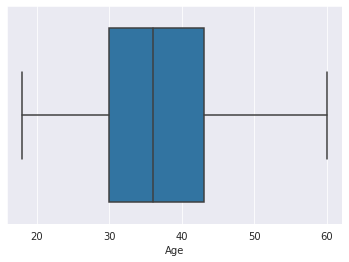

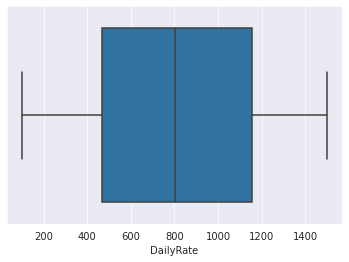

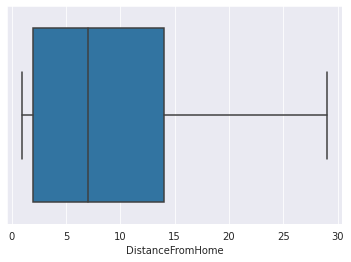

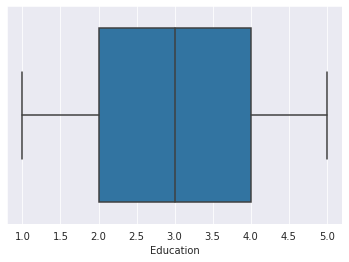

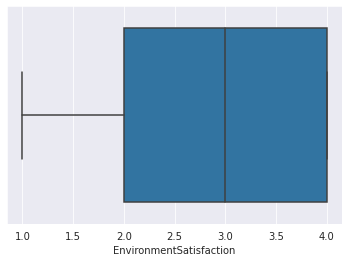

...

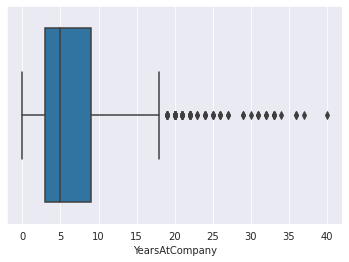

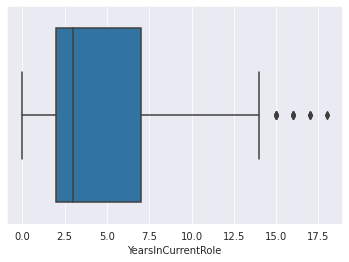

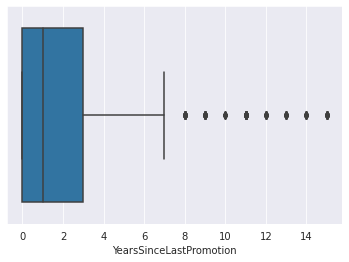

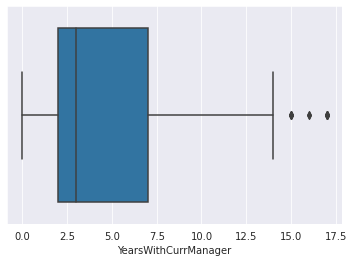

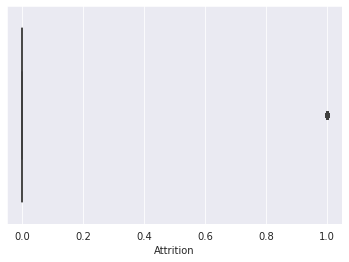

In [ ]:
for i in num:
    sns.boxplot(df[i])
    plt.show()

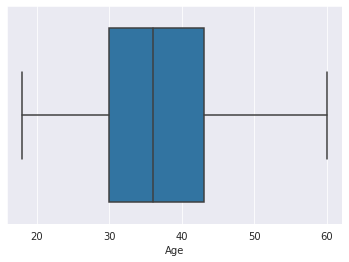

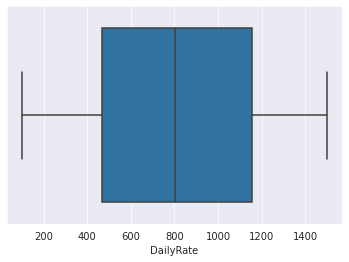

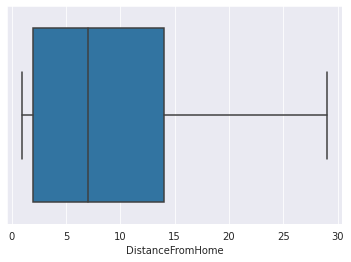

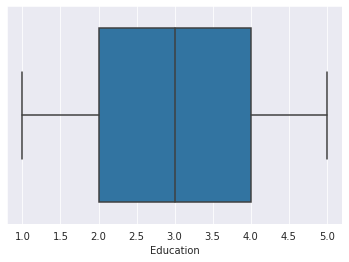

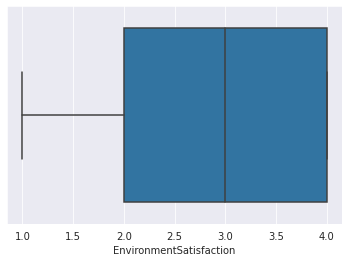

...

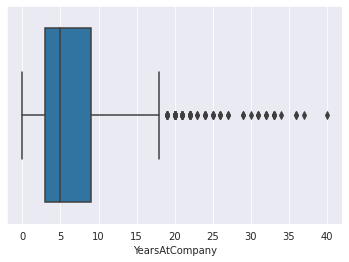

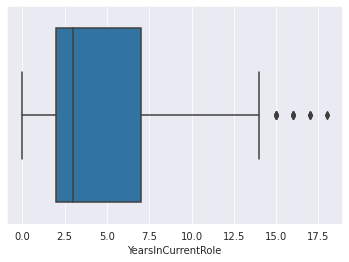

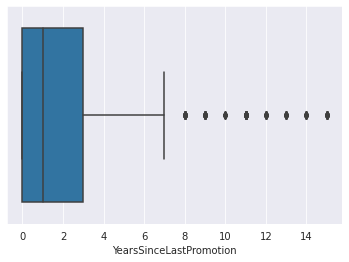

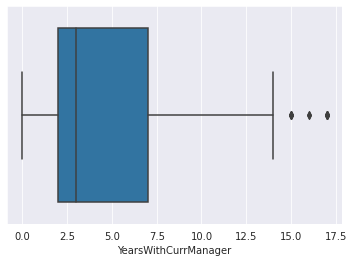

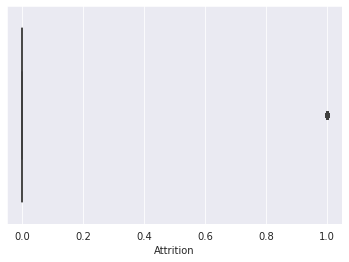

In [ ]:
for i in num:
    sns.boxplot(df[i])
    plt.show()

In [ ]:
# seerms some features have outliers, letas check if they are actually outliers or not

In [ ]:
df['MonthlyIncome'].unique()

array([5993, 5130, 2090, ..., 9991, 5390, 4404])

In [ ]:
df['MonthlyIncome'].describe()

count     1470.000000
mean      6502.931293
std       4707.956783
min       1009.000000
25%       2911.000000
50%       4919.000000
75%       8379.000000
max      19999.000000
Name: MonthlyIncome, dtype: float64

In [ ]:
# FEw high posts have rarely high income. It could be true

In [ ]:
df['NumCompaniesWorked'].describe()

count    1470.000000
mean        2.693197
std         2.498009
min         0.000000
25%         1.000000
50%         2.000000
75%         4.000000
max         9.000000
Name: NumCompaniesWorked, dtype: float64

In [ ]:
df[df['NumCompaniesWorked']==9]

,Age,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition
4,27,Travel_Rarely,591,Research & Development,2,1,Medical,1,Male,40,3,Laboratory Technician,2,Married,3468,16632,9,No,12,3,4,1,6,3,3,2,2,2,2,0
38,36,Travel_Rarely,852,Research & Development,5,4,Life Sciences,2,Female,82,2,Research Scientist,1,Married,3419,13072,9,Yes,14,3,4,1,6,3,4,1,1,0,0,0
50,48,Travel_Rarely,626,Research & Development,1,2,Life Sciences,1,Male,98,2,Laboratory Technician,3,Single,5381,19294,9,Yes,13,3,4,0,23,2,3,1,0,0,0,1
95,54,Travel_Rarely,1217,Research & Development,2,4,Technical Degree,1,Female,60,3,Research Director,3,Married,13549,24001,9,No,12,3,1,1,16,5,1,4,3,0,3,0
105,59,Non-Travel,1420,Human Resources,2,4,Human Resources,3,Female,32,2,Manager,4,Married,18844,21922,9,No,21,4,4,1,30,3,3,3,2,2,2,0
122,56,Travel_Rarely,441,Research & Development,14,4,Life Sciences,2,Female,72,3,Research Scientist,2,Married,4963,4510,9,Yes,18,3,1,3,7,2,3,5,4,4,3,1
194,45,Non-Travel,1195,Research & Development,2,2,Medical,1,Male,65,2,Manager,4,Married,16792,20462,9,No,23,4,4,1,22,1,3,20,8,11,8,0
198,38,Travel_Rarely,1261,Research & Development,2,4,Life Sciences,4,Male,88,3,Manufacturing Director,3,Married,6553,7259,9,No,14,3,2,0,14,3,3,1,0,0,0,0
208,40,Non-Travel,1151,Research & Development,9,5,Life Sciences,4,Male,63,2,Healthcare Representative,4,Married,4876,14242,9,No,14,3,4,1,5,5,1,3,2,0,2,0
245,31,Travel_Frequently,1327,Research & Development,3,4,Medical,2,Male,73,3,Research Director,3,Divorced,13675,13523,9,No,12,3,1,1,9,3,3,2,2,2,2,0


In [ ]:
# If a person starte working at 18, possibly at low jobe profile he can change job every year.

In [ ]:
df['PercentSalaryHike'].unique()

array([11, 23, 15, 12, 13, 20, 22, 21, 17, 14, 16, 18, 19, 24, 25])

In [ ]:

df['PercentSalaryHike'].describe()

count    1470.000000
mean       15.209524
std         3.659938
min        11.000000
25%        12.000000
50%        14.000000
75%        18.000000
max        25.000000
Name: PercentSalaryHike, dtype: float64

In [ ]:
# 25% salary hike is resonable for few emoployees, definatley not an outlier

In [ ]:
df['PerformanceRating'].unique()

array([3, 4])

In [ ]:
# definately not an outlier

In [ ]:
df['StockOptionLevel'].unique()

array([0, 1, 3, 2])

In [ ]:
# Not an outlier

In [ ]:
df['TotalWorkingYears'].unique()

array([ 8, 10,  7,  6, 12,  1, 17,  5,  3, 31, 13,  0, 26, 24, 22,  9, 19,
        2, 23, 14, 15,  4, 29, 28, 21, 25, 20, 11, 16, 37, 38, 30, 40, 18,
       36, 34, 32, 33, 35, 27])

In [ ]:
df['TotalWorkingYears'].describe()

count    1470.000000
mean       11.279592
std         7.780782
min         0.000000
25%         6.000000
50%        10.000000
75%        15.000000
max        40.000000
Name: TotalWorkingYears, dtype: float64

In [ ]:
df['TotalWorkingYears'].max()

40

In [ ]:

df[df['TotalWorkingYears']==40]

,Age,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition
126,58,Travel_Rarely,147,Research & Development,23,4,Medical,4,Female,94,3,Healthcare Representative,4,Married,10312,3465,1,No,12,3,4,1,40,3,2,40,10,15,6,1
595,58,Travel_Rarely,286,Research & Development,2,4,Life Sciences,4,Male,31,3,Research Director,2,Single,19246,25761,7,Yes,12,3,4,0,40,2,3,31,15,13,8,1


In [ ]:
# yes it be person start working at 18 till 58 which completes 18 years

In [ ]:
#Not an outlier

In [ ]:
df['TrainingTimesLastYear'].unique()

array([0, 3, 2, 5, 1, 4, 6])

In [ ]:

df['TrainingTimesLastYear'].describe()

count    1470.000000
mean        2.799320
std         1.289271
min         0.000000
25%         2.000000
50%         3.000000
75%         3.000000
max         6.000000
Name: TrainingTimesLastYear, dtype: float64

In [ ]:
# Not an outlier

In [ ]:

df['YearsAtCompany'].unique()

array([ 6, 10,  0,  8,  2,  7,  1,  9,  5,  4, 25,  3, 12, 14, 22, 15, 27,
       21, 17, 11, 13, 37, 16, 20, 40, 24, 33, 19, 36, 18, 29, 31, 32, 34,
       26, 30, 23])

In [ ]:

df['YearsAtCompany'].max()

40

In [ ]:

df[df['YearsAtCompany']==40]

,Age,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition
126,58,Travel_Rarely,147,Research & Development,23,4,Medical,4,Female,94,3,Healthcare Representative,4,Married,10312,3465,1,No,12,3,4,1,40,3,2,40,10,15,6,1


In [ ]:

# Not an outlier

In [ ]:

df['YearsInCurrentRole'].unique()

array([ 4,  7,  0,  2,  5,  9,  8,  3,  6, 13,  1, 15, 14, 16, 11, 10, 12,
       18, 17])

In [ ]:
df['YearsInCurrentRole'].describe()

count    1470.000000
mean        4.229252
std         3.623137
min         0.000000
25%         2.000000
50%         3.000000
75%         7.000000
max        18.000000
Name: YearsInCurrentRole, dtype: float64

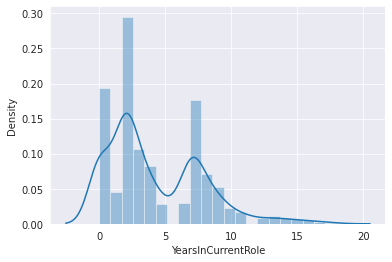

In [ ]:
sns.distplot(df['YearsInCurrentRole'])

In [ ]:
# This is not an outlier, very few peoples have 20 ye experience in current role

In [ ]:
df['YearsSinceLastPromotion'].unique()

array([ 0,  1,  3,  2,  7,  4,  8,  6,  5, 15,  9, 13, 12, 10, 11, 14])

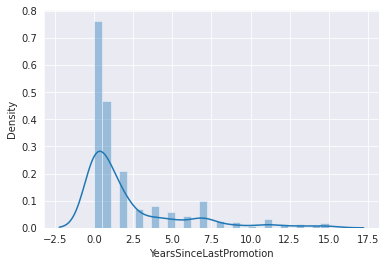

In [ ]:
sns.distplot(df['YearsSinceLastPromotion'])

In [ ]:
# Categorical feature and definetly not an outlier

In [ ]:
df['YearsWithCurrManager'].unique()

array([ 5,  7,  0,  2,  6,  8,  3, 11, 17,  1,  4, 12,  9, 10, 15, 13, 16,
       14])

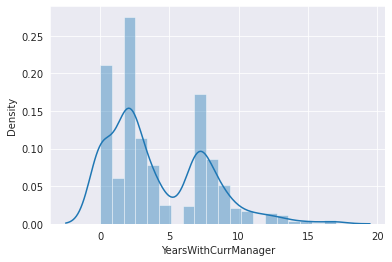

In [ ]:
sns.distplot(df['YearsWithCurrManager'])

In [ ]:
df[df['YearsWithCurrManager']==16]

,Age,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition
561,52,Travel_Rarely,621,Sales,3,4,Marketing,3,Male,31,2,Manager,1,Married,16856,10084,1,No,11,3,1,0,34,3,4,34,6,1,16,0
1348,40,Travel_Rarely,1137,Research & Development,1,4,Life Sciences,1,Male,98,3,Manager,1,Divorced,16823,18991,2,No,11,3,1,1,22,3,3,19,7,11,16,0


In [ ]:

#if yearsatcompany is more than 16, than yearswithcurrntmanager could be 16, not an outlier

In [ ]:

df.columns

Index(['Age', 'BusinessTravel', 'DailyRate', 'Department', 'DistanceFromHome',
       'Education', 'EducationField', 'EnvironmentSatisfaction', 'Gender',
       'HourlyRate', 'JobInvolvement', 'JobRole', 'JobSatisfaction',
       'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'OverTime', 'PercentSalaryHike', 'PerformanceRating',
       'RelationshipSatisfaction', 'StockOptionLevel', 'TotalWorkingYears',
       'TrainingTimesLastYear', 'WorkLifeBalance', 'YearsAtCompany',
       'YearsInCurrentRole', 'YearsSinceLastPromotion', 'YearsWithCurrManager',
       'Attrition'],
      dtype='object')

In [ ]:
# We dnt see any much outliers in the dataset


Handle categorical features

In [ ]:

df.select_dtypes('O')

,BusinessTravel,Department,EducationField,Gender,JobRole,MaritalStatus,OverTime
0,Travel_Rarely,Sales,Life Sciences,Female,Sales Executive,Single,Yes
1,Travel_Frequently,Research & Development,Life Sciences,Male,Research Scientist,Married,No
2,Travel_Rarely,Research & Development,Other,Male,Laboratory Technician,Single,Yes
3,Travel_Frequently,Research & Development,Life Sciences,Female,Research Scientist,Married,Yes
4,Travel_Rarely,Research & Development,Medical,Male,Laboratory Technician,Married,No
...,...,...,...,...,...,...,...
1465,Travel_Frequently,Research & Development,Medical,Male,Laboratory Technician,Married,No
1466,Travel_Rarely,Research & Development,Medical,Male,Healthcare Representative,Married,No
1467,Travel_Rarely,Research & Development,Life Sciences,Male,Manufacturing Director,Married,Yes
1468,Travel_Frequently,Sales,Medical,Male,Sales Executive,Married,No


In [ ]:

df.shape

(1470, 30)

In [ ]:
df.columns

Index(['Age', 'BusinessTravel', 'DailyRate', 'Department', 'DistanceFromHome',
       'Education', 'EducationField', 'EnvironmentSatisfaction', 'Gender',
       'HourlyRate', 'JobInvolvement', 'JobRole', 'JobSatisfaction',
       'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'OverTime', 'PercentSalaryHike', 'PerformanceRating',
       'RelationshipSatisfaction', 'StockOptionLevel', 'TotalWorkingYears',
       'TrainingTimesLastYear', 'WorkLifeBalance', 'YearsAtCompany',
       'YearsInCurrentRole', 'YearsSinceLastPromotion', 'YearsWithCurrManager',
       'Attrition'],
      dtype='object')

In [ ]:
df['Attrition'].value_counts()

0    1233
1     237
Name: Attrition, dtype: int64

In [ ]:
df.head()

,Age,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition
0,41,Travel_Rarely,1102,Sales,1,2,Life Sciences,2,Female,94,3,Sales Executive,4,Single,5993,19479,8,Yes,11,3,1,0,8,0,1,6,4,0,5,1
1,49,Travel_Frequently,279,Research & Development,8,1,Life Sciences,3,Male,61,2,Research Scientist,2,Married,5130,24907,1,No,23,4,4,1,10,3,3,10,7,1,7,0
2,37,Travel_Rarely,1373,Research & Development,2,2,Other,4,Male,92,2,Laboratory Technician,3,Single,2090,2396,6,Yes,15,3,2,0,7,3,3,0,0,0,0,1
3,33,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,4,Female,56,3,Research Scientist,3,Married,2909,23159,1,Yes,11,3,3,0,8,3,3,8,7,3,0,0
4,27,Travel_Rarely,591,Research & Development,2,1,Medical,1,Male,40,3,Laboratory Technician,2,Married,3468,16632,9,No,12,3,4,1,6,3,3,2,2,2,2,0


In [ ]:
X= df.drop('Attrition', axis=1)
Y=df['Attrition']

In [ ]:

X.shape , Y.shape

((1470, 29), (1470,))

Balancing Data

In [ ]:
X=pd.get_dummies(X,drop_first=True)

In [ ]:
X.shape

(1470, 43)

In [ ]:
X

,Age,DailyRate,DistanceFromHome,Education,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobSatisfaction,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,BusinessTravel_Travel_Frequently,BusinessTravel_Travel_Rarely,Department_Research & Development,Department_Sales,EducationField_Life Sciences,EducationField_Marketing,EducationField_Medical,EducationField_Other,EducationField_Technical Degree,Gender_Male,JobRole_Human Resources,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,MaritalStatus_Married,MaritalStatus_Single,OverTime_Yes
0,41,1102,1,2,2,94,3,4,5993,19479,8,11,3,1,0,8,0,1,6,4,0,5,0,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,1
1,49,279,8,1,3,61,2,2,5130,24907,1,23,4,4,1,10,3,3,10,7,1,7,1,0,1,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0
2,37,1373,2,2,4,92,2,3,2090,2396,6,15,3,2,0,7,3,3,0,0,0,0,0,1,1,0,0,0,0,1,0,1,0,1,0,0,0,0,0,0,0,1,1
3,33,1392,3,4,4,56,3,3,2909,23159,1,11,3,3,0,8,3,3,8,7,3,0,1,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1
4,27,591,2,1,1,40,3,2,3468,16632,9,12,3,4,1,6,3,3,2,2,2,2,0,1,1,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,884,23,2,3,41,4,4,2571,12290,4,17,3,3,1,17,3,3,5,2,0,3,1,0,1,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,1,0,0
1466,39,613,6,1,4,42,2,1,9991,21457,4,15,3,1,1,9,5,3,7,7,1,7,0,1,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0
1467,27,155,4,3,2,87,4,2,6142,5174,1,20,4,2,1,6,0,3,6,2,0,3,0,1,1,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,1
1468,49,1023,2,3,4,63,2,2,5390,13243,2,14,3,4,0,17,3,2,9,6,0,8,1,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,1,0,1,0,0


In [ ]:
X.skew()

Age                                  0.413286
DailyRate                           -0.003519
DistanceFromHome                     0.958118
Education                           -0.289681
EnvironmentSatisfaction             -0.321654
HourlyRate                          -0.032311
JobInvolvement                      -0.498419
JobSatisfaction                     -0.329672
MonthlyIncome                        1.369817
MonthlyRate                          0.018578
NumCompaniesWorked                   1.026471
PercentSalaryHike                    0.821128
PerformanceRating                    1.921883
RelationshipSatisfaction            -0.302828
StockOptionLevel                     0.968980
TotalWorkingYears                    1.117172
TrainingTimesLastYear                0.553124
WorkLifeBalance                     -0.552480
YearsAtCompany                       1.764529
YearsInCurrentRole                   0.917363
YearsSinceLastPromotion              1.984290
YearsWithCurrManager              

Transformation

In [ ]:
from sklearn.preprocessing import power_transform
transformed=power_transform(X)

In [ ]:
pd.DataFrame(transformed).skew()

0    -0.007603
1    -0.196160
2    -0.007468
3    -0.099881
4    -0.205395
5    -0.106461
6    -0.020365
7    -0.212815
8     0.000000
9    -0.184087
10    0.014814
11    0.116250
12    0.000000
13   -0.193634
14    0.087019
15   -0.010653
16    0.058058
17   -0.012286
18   -0.008683
19   -0.060849
20    0.212129
21   -0.067565
22    1.595067
23   -0.923992
24   -0.646936
25    0.856158
26    0.356919
27    2.525783
28    0.794118
29    3.875119
30    2.872604
31   -0.408665
32    5.035637
33    1.701604
34    3.392611
35    2.694844
36    3.932443
37    1.512214
38    1.340834
39    3.847192
40    0.169484
41    0.773874
42    0.964489
dtype: float64

Standardization

In [ ]:
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()

In [ ]:
scaled=sc.fit_transform(transformed)

In [ ]:
X= scaled

Balancing

In [ ]:
from imblearn.over_sampling import SMOTE
sm=SMOTE()

In [ ]:
x,y=sm.fit_resample(X,Y)

In [ ]:
x.shape , y.shape

((2466, 43), (2466,))

MAchine Learning

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report

In [ ]:
# FInd best Random_state

maxaccu=0
maxRS=0

for i in range(0,200):
    x_train,x_test,y_train,y_test= train_test_split(x,y,random_state=i,test_size=.20)
    LR= LogisticRegression()
    LR.fit(x_train,y_train)
    pred= LR.predict(x_test)
    acc=accuracy_score(y_test,pred)
    if acc>maxaccu:
        maxaccu=acc
        maxRS=i
print("Best accuracy is ",maxaccu,"on Random State =",maxRS)
    

Best accuracy is  0.8481781376518218 on Random State = 124


In [ ]:
# Select Random State 26

In [ ]:
x_train,x_test,y_train,y_test= train_test_split(x,y,random_state=197,test_size=.20)

In [ ]:

from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import RidgeClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.linear_model import SGDClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier

In [ ]:
LR_model= LogisticRegression()
RD_model= RidgeClassifier()
DT_model= DecisionTreeClassifier()
SV_model= SVC()
KNR_model= KNeighborsClassifier()
RFR_model= RandomForestClassifier()
XGB_model= XGBClassifier()
SGH_model= SGDClassifier()
Bag_model=BaggingClassifier()
ADA_model=AdaBoostClassifier()
GB_model= GradientBoostingClassifier()

model=[LR_model,RD_model,DT_model,SV_model,KNR_model,RFR_model,XGB_model,SGH_model,Bag_model,ADA_model,GB_model ]

In [ ]:
for m in model:
    m.fit(x_train,y_train)
    m.score(x_train,y_train)
    pred= m.predict(x_test)
    print('Accuracy_Score of ',m, 'is', accuracy_score(y_test,pred)*100)
    print('Confusion Matrix of ',m,' is \n', confusion_matrix(y_test,pred) )
    print(classification_report(y_test,pred))
    print('*'*50)

Accuracy_Score of  LogisticRegression() is 84.41295546558705
Confusion Matrix of  LogisticRegression()  is 
 [[211  37]
 [ 40 206]]
              precision    recall  f1-score   support

           0       0.84      0.85      0.85       248
           1       0.85      0.84      0.84       246

    accuracy                           0.84       494
   macro avg       0.84      0.84      0.84       494
weighted avg       0.84      0.84      0.84       494

**************************************************
Accuracy_Score of  RidgeClassifier() is 82.99595141700405
Confusion Matrix of  RidgeClassifier()  is 
 [[204  44]
 [ 40 206]]
              precision    recall  f1-score   support

           0       0.84      0.82      0.83       248
           1       0.82      0.84      0.83       246

    accuracy                           0.83       494
   macro avg       0.83      0.83      0.83       494
weighted avg       0.83      0.83      0.83       494

*************************************

In [ ]:
# Logistic Regression performance is best with accuracy 93%

CrossValidation

In [ ]:
from sklearn.model_selection import cross_val_score

In [ ]:
for i in model:
    print('Accuracy_Score of ',i, 'is', accuracy_score(y_test,i.predict(x_test))*100)
    print("cross Validation accuracy score of ",i ," is ",cross_val_score(i,x,y,cv=5, scoring='accuracy').mean()*100)
    print('*'*50)

Accuracy_Score of  LogisticRegression() is 84.41295546558705
cross Validation accuracy score of  LogisticRegression()  is  81.30605809264931
**************************************************
Accuracy_Score of  RidgeClassifier() is 82.99595141700405
cross Validation accuracy score of  RidgeClassifier()  is  80.73859950234457
**************************************************
Accuracy_Score of  DecisionTreeClassifier() is 84.21052631578947
cross Validation accuracy score of  DecisionTreeClassifier()  is  84.39497088797825
**************************************************
Accuracy_Score of  SVC() is 93.11740890688259
cross Validation accuracy score of  SVC()  is  92.74293551009683
**************************************************
Accuracy_Score of  KNeighborsClassifier() is 81.9838056680162
cross Validation accuracy score of  KNeighborsClassifier()  is  80.9821714529732
**************************************************
Accuracy_Score of  RandomForestClassifier() is 94.12955465587044
c


Hypertuning of RandomForest

In [ ]:
n_estimator= [200, 400, 600, 800, 1000]  # no of tree in Random forest, default is 100
max_features= ['auto','sqrt','log2']  # mini no of features to create Decission Tree
max_depth=[10, 64, 118, 173, 227, 282, 336]  #  Max depth of decision tree
min_samples_split= [1,2,3]   # mini no of sample rerquired to split node
min_samples_leaf= [1,3,4,6,7,9]  #mini no of sample required at each leaf node

param_grid= {'n_estimators': n_estimator,
             'max_features':max_features,
             'max_depth':max_depth,
             'min_samples_split':min_samples_split,
             'min_samples_leaf':min_samples_leaf,
             }
param_grid

{'n_estimators': [200, 400, 600, 800, 1000],
 'max_features': ['auto', 'sqrt', 'log2'],
 'max_depth': [10, 64, 118, 173, 227, 282, 336],
 'min_samples_split': [1, 2, 3],
 'min_samples_leaf': [1, 3, 4, 6, 7, 9]}

In [ ]:
from sklearn.model_selection import GridSearchCV

In [ ]:
grid_search=GridSearchCV(estimator=RFR_model,param_grid=param_grid,cv=5,n_jobs=-1,verbose=2)
grid_search.fit(x_train,y_train)

Fitting 5 folds for each of 1890 candidates, totalling 9450 fits
